# **1 금융 데이터와 전처리**
**[Github 금융 파이썬 쿡북](https://nbviewer.jupyter.org/github/AcornPublishing/python-finance/tree/main/)** \\ **[mark down](https://twinstarinfo.blogspot.com/2019/11/bloggerblogspot-markdown-mathjax.html)** \\  **[Finance-data](https://github.com/FinanceData/FinanceDataReader)**

- ! pip install finance-datareader
- ! pip install beautifulsoup4

In [1]:
# import os
# import pandas as pd
# file_name = './data/stock-twitter.csv'

# # Checking the File exist
# if os.path.isfile(file_name):
#     df_twiter = pd.read_csv(file_name)
#     df_twiter['Date'] = pd.to_datetime(df_twiter['Date']) # datetime 포맷 변경
#     df_twiter = df_twiter.set_index('Date')               # 변경된 컬럼을 Index 로 설정

# # if not, download the data
# else:
#     import yfinance as yf
#     df_twiter = yf.download('TWTR', start='2020-01-01', end='2021-03-01',
#         progress=False, auto_adjust=True).reset_index()
#     df_twiter.to_csv(file_name, index=None)
# df_twiter.head(3)

## **Pandas**
with Pandas
- **.where()** : True 를 그대로 출력, False 는 other 값으로 대체
- **.mask()** : False 를 그대로 출력, True 는 other 값으로 대체
- **.diff()** : 앞뒤 데이터 차이값 생성
- **.pct_change()** : 앞뒤 데이터 변화율 생성
- **.cumsum()** : 누적 합 생성
- **.cummax()** : 누적 최댓값을 비교하여, 최댓값 출력
- **.cummin()** : 누적 최솟값을 비교하여, 최솟값 출력
- **.unique()** : 고유값 Series 생성
- **.isna().sum()** : DataFrame 의 NaN 값들의 합
- **.agg([ <span style="color:lightgreen"> 'mean', 'std' </span>], axis=0)** : max, min, sum, mean 과 같은 통계결과값 컬럼별 생성
- **.apply(<span style="color:lightgreen"> <함수> </span> )** : 특정 컬럼의 데이터를 함수적용한 결과값으로 새로운 Series 생성 
- **[.rank](https://hogni.tistory.com/48)** : Series 의 데이터 순위 값 출력
- **[.apply](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.apply.html)** : 데이터 값들을 바꾼다 (ex> np.sqrt)
- **[.asfreq](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.asfreq.html)** : 컬럼별 함수 적용 결과값을 덮어쓴다 (ex> freq='M')

In [2]:
import pandas as pd
import numpy as np
df_test = pd.DataFrame([[4,9]] * 3, columns=['a','b'])
df_test.apply(np.sqrt)

,a,b
0,2.0,3.0
1,2.0,3.0
2,2.0,3.0


## **1 주식 수익률 공식**
가격은 일반적인 비정상성(Non Stationary) 특징을 함께 갖고 있다.
- 단순 수익률 : 포트폴리오 자산 수익률 단순 합산으로 계산한 값이다 (상대적 큰값)
- 로그 수익률 : 일별 로그 수익률은 기간별 로그값 합산으로 계산한 값이다 (상대적 작은값)
$$R_t (단순 수익률) = {(P_t - P_{t-1}) \over P_{t-1}} = {P_t \over P_{t-1}} -1 $$
$$r_t (로그 수익률) = {log({P_t \over P_{t-1}})} = log({P_t}) - log({P_{t-1}})$$

In [3]:
DATA_FILENAME = 'data/stock-samsung.pkl'
import pandas as pd
import FinanceDataReader as fdr
try:
    data_stock = pd.read_pickle(DATA_FILENAME)
except FileNotFoundError:
    data_stock = fdr.DataReader('005930', '1999-01-01')
    data_stock.to_pickle(DATA_FILENAME)
data_stock.head(3)

,Open,High,Low,Close,Volume,Change
Date,,,,,,
1999-01-04,1776,1776,1624,1693,666160,0.095084
1999-01-05,1692,1712,1649,1673,643209,-0.011813
1999-01-06,1702,1720,1651,1718,645110,0.026898


In [4]:
import numpy as np
df = data_stock.loc[:, ['Close']] # cf) .loc[:, 'Close'] : Series 추출
df.rename(columns={'Close':'adj_close'}, inplace=True)

# 추가 수익률 계산내용의 추가
df['simple_rtn'] = df.adj_close.pct_change()                  # 단순 수익률 계산 (자산기준 수익률 가중화 합산)
df['log_rtn'] = np.log(df.adj_close / df.adj_close.shift(1))  # Log 수익률 계산 (시간에 따른 수익률 log 합산)
df.head(3)

,adj_close,simple_rtn,log_rtn
Date,,,
1999-01-04,1693,NaN,NaN
1999-01-05,1673,-0.011813,-0.011884
1999-01-06,1718,0.026898,0.026542


In [5]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
import matplotlib.pyplot as plt
from matplotlib.font_manager import fontManager as fm

plt.style.use('seaborn') # 'seaborn-colorblind'
plt.rc('axes', unicode_minus=False)
warnings.simplefilter(action='ignore', category=FutureWarning)
font_list_check  = ['D2Coding', 'NanumGothicCoding', 'NanumGothic']
for font in font_list_check:
    font_counts = [ f  for f in font_list_check 
        if font in [_.name for _ in fm.ttflist]]
    if len(font_counts) > 1: 
        print(f"found : {font}"); break
        
# 폰트 적용하기
plt.rc('font', family=font)        

found : D2Coding


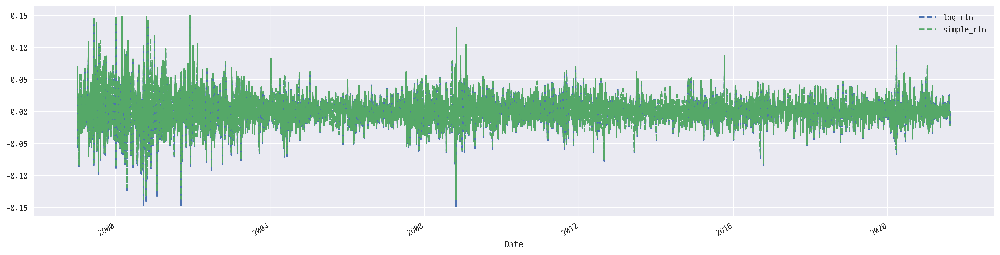

In [6]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = (20.0, 5.0)
df.log_rtn.plot(linestyle="--")
df.simple_rtn.plot(linestyle="--")
plt.legend(); plt.show()

## **2 금융 추가정보 확보하기**
인플레이션 데이터를 활용하여, 주가의 비정상성을 줄인다
- 월간 소비자 물가지수를 활용하여 지수변동률 변환하기
- 인플레이션을 고려한 가격 적용하기

$R^r_t = {{1+R_t (단순 수익률)  } \over {1+ \pi_t (인플레이션율) }} - 1 $

### **1) Join the Tables**

In [7]:
# 기준 테이블을 생성한 뒤, 다른 데이터의 값을 덧붙이는 예시
df_all_dates = data_stock.loc['1999-12-31':'2010-12-31', :]
df_all_dates.join(df[['adj_close']], how='left').fillna(method="ffill").asfreq(freq='M').tail()

,Open,High,Low,Close,Volume,Change,adj_close
Date,,,,,,,
2010-07-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-08-31,15320.0,15439.0,15119.0,15120.0,441643.0,-0.025773,15120.0
2010-09-30,15440.0,15580.0,15340.0,15540.0,337258.0,0.006477,15540.0
2010-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-11-30,16640.0,16920.0,16520.0,16520.0,424616.0,-0.011962,16520.0


### **2) BOK EOS 한국은행 통계정보 API**
- **[한국은행 API Key 확인하기](https://ecos.bok.or.kr/jsp/openapi/OpenApiController.jsp?t=myAuthKey#)**
- **[한국은행 통계코드 검색](https://ecos.bok.or.kr/jsp/openapi/OpenApiController.jsp?t=guideStatCd&menuGroup=MENU000004&menuCode=MENU000024)**
- **[EOS Python Tutorial](https://ecos.bok.or.kr/jsp/openapi/OpenApiController.jsp?t=guideDevGuide&menuGroup=MENU000004&menuCode=MENU000017)**
- **[Python Example 1](https://hayjo.tistory.com/57)** // **[Python Example 2](https://bjecondata.blogspot.com/2019/08/open-api-ecos-ii.html)**

```python
file_name = 'data/BOK_ECOS_statistics list_monthly_detailed.xlsx'
import re
import pandas as pd
code_table = pd.read_excel(file_name, header=4).iloc[:, :-2]
index_valid = [
    no   for no,_ in enumerate(code_table['항목명1']) 
    if (_.find('%') == -1) & (_ != '모르겠다')]
code_table = code_table.iloc[index_valid, :]
code_table.to_csv('data/BOK_ECOS_statistics_codes.csv', index=None)
```

In [8]:
file_name = 'data/BOK_ECOS_statistics_codes.csv'
import re
import pandas as pd
code_table = pd.read_csv(file_name)
code_table.tail(3)

,통계코드,통계명,항목코드1,항목명1,항목코드2,항목명2,항목코드3,항목명3,단위,검색URL
17098,I05Y002,18.1.14 실업률(계절변동조정),TWN,대만,NaN,NaN,NaN,NaN,%,http://ecos.bok.or.kr/api/StatisticSearch/[본인의...
17099,I05Y002,18.1.14 실업률(계절변동조정),UK,영국,NaN,NaN,NaN,NaN,%,http://ecos.bok.or.kr/api/StatisticSearch/[본인의...
17100,I05Y002,18.1.14 실업률(계절변동조정),USA,미국,NaN,NaN,NaN,NaN,%,http://ecos.bok.or.kr/api/StatisticSearch/[본인의...


In [9]:
# 필요한 자료코드 추출하기
search_text = '인플레'
code_index = []
for column in ['통계명', '항목명1']:
    code_index += [
    no  for no, _ in enumerate(code_table[column].to_list())
    if _.find(search_text) != -1]
code_example = code_table.iloc[code_index, :].drop_duplicates().reset_index(drop=True)
code_example.iloc[:, :-1]

,통계코드,통계명,항목코드1,항목명1,항목코드2,항목명2,항목코드3,항목명3,단위
0,040Y003,9.2.3 소비자동향조사(기대 인플레이션율)(전국),FMA,물가인식,NaN,NaN,NaN,NaN,NaN
1,040Y003,9.2.3 소비자동향조사(기대 인플레이션율)(전국),FMB,기대인플레이션율,NaN,NaN,NaN,NaN,NaN
2,901Y001,17.거시경제분석 지표,AI1BC,근원인플레이션율,NaN,NaN,NaN,NaN,%


In [10]:
from data.finance import bok_eos_api
eos_table = bok_eos_api('040Y003', date_end='20210801', code2='FMB')  # 7년 단위로만 추출가능
eos_table['DATA_VALUE'] = list(map(lambda x : float(x),  eos_table['DATA_VALUE']))
eos_table = eos_table.rename(columns={'DATA_VALUE':'cpi', 'TIME':'Date'})

eos_table['Date'] = pd.to_datetime(eos_table['Date'], format='%Y%m')
eos_table = eos_table.set_index('Date')  # eos_table.head(3)
eos_table = eos_table[['cpi']]
eos_table.tail(3)

,cpi
Date,
2021-05-01,2.2
2021-06-01,2.3
2021-07-01,2.3


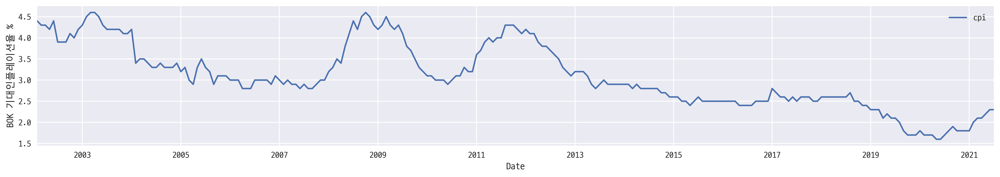

In [11]:
# ploting the DataSet
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = (20.0, 3.0)
fig = plt.figure()
ax = fig.add_subplot(111, ylabel='BOK 기대인플레이션율 %')
eos_table.plot(ax=ax)
plt.show()

### **3) 필요한 정보들을 추출하여 유효 테이블 생성하기**

In [12]:
# CPI 정보를 데이블에 추가하고, 손실된 값들은 제거한다
data_stock.join(eos_table, 
    how='left').fillna(method='ffill').dropna().head(3)

,Open,High,Low,Close,Volume,Change,cpi
Date,,,,,,,
2002-02-01,6200,6320,6090,6180,712813,0.028286,4.4
2002-02-04,6200,6330,6180,6240,476171,0.009709,4.4
2002-02-05,6200,6490,6140,6460,973561,0.035256,4.4


In [13]:
# 분석에 필요한 날짜값을 생성하고
# 이를 기준으로 데이터 필터링
df_all_dates = pd.DataFrame(index=pd.date_range(start='2002-11-30', end='2020-12-31'))
df_monthly = df_all_dates.join(data_stock[['Close']], how='left').fillna(method='ffill').asfreq('M')
df_cpi = df_all_dates.join(eos_table[['cpi']], how='left').fillna(method='ffill').asfreq('M')
df_merge = df_monthly.join(df_cpi, how='left')

# Percent Change 내용 추가하기
df_merge['simple_rtn'] = df_merge.Close.pct_change()
df_merge['inflation_rate'] = df_merge.cpi.pct_change()

# 인플레이션으로 상승한 부분 축소한 값으로 보정
df_merge['real_rtn'] = (df_merge.simple_rtn + 1) / (df_merge.inflation_rate + 1) - 1
df_merge.head(3)

,Close,cpi,simple_rtn,inflation_rate,real_rtn
2002-11-30,NaN,NaN,NaN,NaN,NaN
2002-12-31,6280.0,4.2,NaN,NaN,NaN
2003-01-31,5830.0,4.3,-0.071656,0.02381,-0.093245


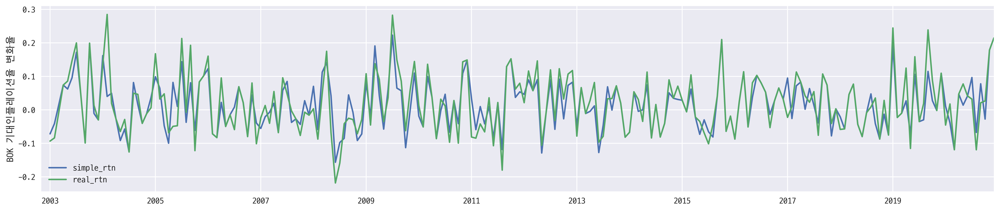

In [14]:
# Visualization
plt.rcParams['figure.figsize'] = (20.0, 4.0)
fig = plt.figure()
ax = fig.add_subplot(111, ylabel='BOK 기대인플레이션율 변화율')
df_merge.simple_rtn.plot(ax=ax)
df_merge.real_rtn.plot(ax=ax)
plt.legend(); plt.show()

## **3 데이터 빈도 변경하기**
Frequency 변경 : 일간 수익률 -> 월별 실현 변동률(realized volatility) -> 연환산 실행 (annualized)

$ RV = \sqrt{ \sum_{i=1}^T r_t^2 } $

### **01 누적 수익률을 활용하여 월간 변화율 계산하기**

In [15]:
# 월간 실현 변동률 계산하는 함수
import numpy as np
def realized_volatility(x):
    return np.sqrt(np.sum(x**2))

df_rv = df.groupby(pd.Grouper(freq='M')).apply(realized_volatility)
df_rv.rename(columns={'log_rtn': 'rv'}, inplace=True)
df_rv.head(3)

,adj_close,simple_rtn,rv
Date,,,
1999-01-31,7785.308729,0.162930,0.163318
1999-02-28,6931.771419,0.110700,0.110177
1999-03-31,8268.400873,0.117199,0.115058


In [16]:
# log 수익룰 값을 환산하는 함수
df_rv.rv = df_rv.rv ** np.sqrt(12)
df_rv.head(3)

,adj_close,simple_rtn,rv
Date,,,
1999-01-31,7785.308729,0.162930,0.001879
1999-02-28,6931.771419,0.110700,0.000481
1999-03-31,8268.400873,0.117199,0.000558


In [17]:
df.head(3)

,adj_close,simple_rtn,log_rtn
Date,,,
1999-01-04,1693,NaN,NaN
1999-01-05,1673,-0.011813,-0.011884
1999-01-06,1718,0.026898,0.026542


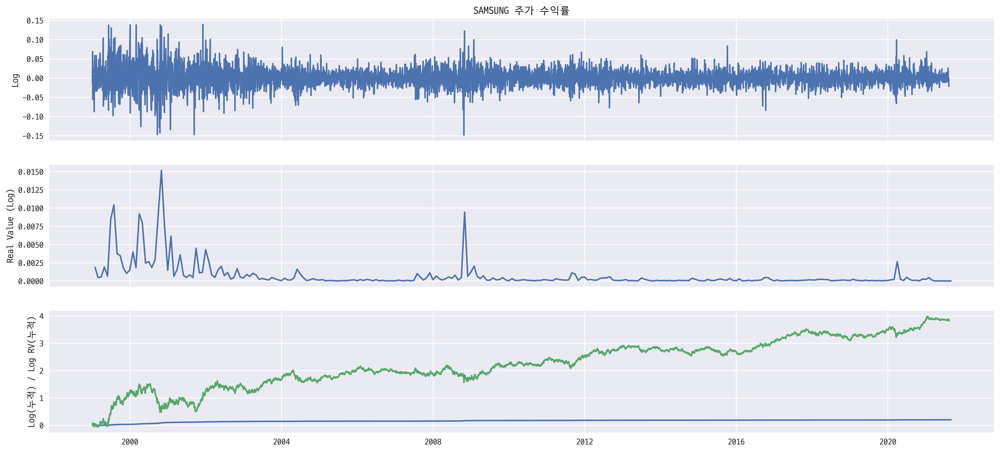

In [18]:
fig, ax = plt.subplots(3,1, figsize=(20,9), sharex=True)
ax[0].plot(df.log_rtn)
ax[0].set(title='SAMSUNG 주가 수익률', ylabel='Log')
ax[1].plot(df_rv.rv)
ax[1].set(ylabel='Real Value (Log)')
ax[2].plot(df_rv.rv.cumsum(), label="")
ax[2].plot(df.log_rtn.cumsum())
ax[2].set(ylabel='Log(누적) / Log RV(누적)')
plt.show()

### **02 월간 평균 수익률의 계산**

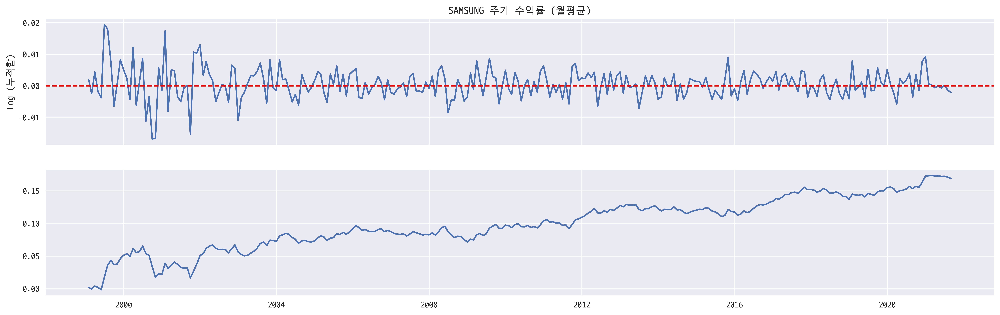

In [19]:
fig, ax = plt.subplots(2,1, figsize=(20, 6), sharex=True)
ax[0].plot(df.log_rtn.resample('M').mean())
ax[0].axhline(y=0, color ='red', linewidth=1.5, linestyle="--")
ax[0].set(title='SAMSUNG 주가 수익률 (월평균)', ylabel='Log')
ax[1].plot(df.log_rtn.resample('M').mean().cumsum())
ax[0].set( ylabel='Log (누적합)')
plt.show()

## **4 Visualization**
### **01 Matplotlib**
- **[한글 꺠지는 문제 해결하기](https://financedata.github.io/posts/matplotlib-hangul-for-ubuntu-linux.html)**
- **[D2Coding Font 설치하기](https://jamix.tistory.com/41)**

In [20]:
fig, ax = plt.subplots(3, 1, figsize=(20,12), sharex=True)
df.adj_close.plot(ax=ax[0])  # 주가 Table
ax[0].set(title='SAMSUNG time series', ylabel='Stock Price (원)')
df.simple_rtn.plot(ax=ax[1]) # 단순 수익률 Table
ax[1].set(ylabel='Simple Return (원)')
df.log_rtn.plot(ax=ax[2])    # log 수익률 Table
ax[2].set(xlabel='Date', ylabel='Log Return (%)')
plt.show()

### **02 Cuffinks**
DataFrame 을 활용하여 Plotly 시각화 활용하는 모듈
- https://pypi.org/project/cufflinks/
- pip install chart_studio
- [Jupyter Lab 에서 plotly 실행하는 방법](https://plotly.com/python/getting-started/#jupyterlab-support)

```r
! pip install cufflinks
! pip install chart_studio
! pip install jupyterlab "ipywidgets>=7.5"
! jupyter labextension install jupyterlab-plotly@4.14.3
```

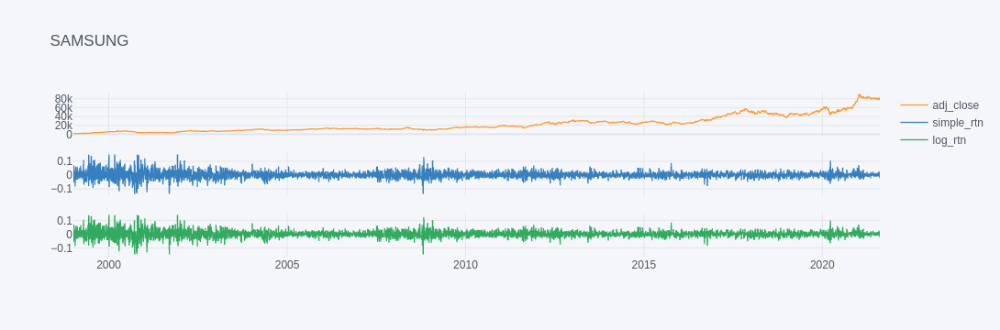

In [21]:
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode

cf.set_config_file(world_readable=True, theme='pearl', offline=True) # set up settings (run it once)
init_notebook_mode(connected=True)  # initialize notebook display

# Plotly from DataFrame
df.iplot(subplots=True, shape=(3,1), shared_xaxes=True, title="SAMSUNG")

## **5 특이값 (outier) 식별**
모델을 만들기 전에 특이값을 처리 합니다

In [22]:
# 이동평균선의 평균과 표준편차를 계산한다
df_rolling = df[['simple_rtn']].rolling(window=21).agg(['mean', 'std'])
df_rolling.columns = df_rolling.columns.droplevel()
df_outliers = df.join(df_rolling)

# 특이값을 추출하는 함수
def indenify_outlisers(row, n_sigmas=3):
    x = row['simple_rtn']
    mu = row['mean']
    sigma = row['std']
    if (x> mu+3 * sigma) | (x < mu -3 * sigma): 
        return 1
    else: 
        return 0

# 특이값 추출함수를 테이블에 Apply 하기
df_outliers['outlier'] = df_outliers.apply(indenify_outlisers, axis=1)
df_outliers.head(3)

,adj_close,simple_rtn,log_rtn,mean,std,outlier
Date,,,,,,
1999-01-04,1693,NaN,NaN,NaN,NaN,0
1999-01-05,1673,-0.011813,-0.011884,NaN,NaN,0
1999-01-06,1718,0.026898,0.026542,NaN,NaN,0


In [23]:
# 특이점 Point 테이블
outlier = df_outliers.loc[df_outliers['outlier']==1, ['simple_rtn']] # 1 표시된 값 추출하기
outlier.head(3)

,simple_rtn
Date,
2001-09-12,-0.136364
2001-12-05,0.150000
2002-06-26,-0.087149


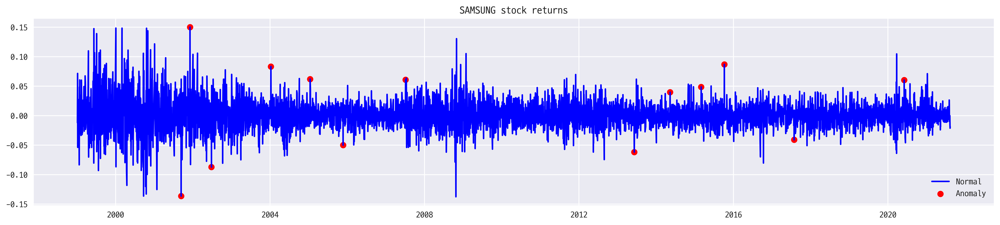

In [24]:
# Visualization
fix, ax = plt.subplots()
ax.plot(df_outliers.index, df_outliers.simple_rtn, color='blue', label='Normal')
ax.scatter(outlier.index, outlier.simple_rtn, color='red', label='Anomaly')
ax.set_title('SAMSUNG stock returns')
ax.legend(loc='lower right')
plt.show()